<h1>Order Cancellation Trends and Insights from the Status Column in Amazon Sale Report Data</h1>

In [8]:
import pandas as pd
import matplotlib.pyplot as plt

#To read a csv file
data = pd.read_csv('archive\Amazon Sale Report.csv')
data

C:\Users\user\anaconda3_ne\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (23) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,index,Order ID,Date,Status,Fulfilment,Sales Channel,ship-service-level,Style,SKU,Category,...,currency,Amount,ship-city,ship-state,ship-postal-code,ship-country,promotion-ids,B2B,fulfilled-by,Unnamed: 22
0,0,405-8078784-5731545,04-30-22,Cancelled,Merchant,Amazon.in,Standard,SET389,SET389-KR-NP-S,Set,...,INR,647.62,MUMBAI,MAHARASHTRA,400081.0,IN,NaN,False,Easy Ship,NaN
1,1,171-9198151-1101146,04-30-22,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,JNE3781,JNE3781-KR-XXXL,kurta,...,INR,406.00,BENGALURU,KARNATAKA,560085.0,IN,Amazon PLCC Free-Financing Universal Merchant ...,False,Easy Ship,NaN
2,2,404-0687676-7273146,04-30-22,Shipped,Amazon,Amazon.in,Expedited,JNE3371,JNE3371-KR-XL,kurta,...,INR,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,True,NaN,NaN
3,3,403-9615377-8133951,04-30-22,Cancelled,Merchant,Amazon.in,Standard,J0341,J0341-DR-L,Western Dress,...,INR,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,IN,NaN,False,Easy Ship,NaN
4,4,407-1069790-7240320,04-30-22,Shipped,Amazon,Amazon.in,Expedited,JNE3671,JNE3671-TU-XXXL,Top,...,INR,574.00,CHENNAI,TAMIL NADU,600073.0,IN,NaN,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128970,128970,406-6001380-7673107,05-31-22,Shipped,Amazon,Amazon.in,Expedited,JNE3697,JNE3697-KR-XL,kurta,...,INR,517.00,HYDERABAD,TELANGANA,500013.0,IN,NaN,False,NaN,False
128971,128971,402-9551604-7544318,05-31-22,Shipped,Amazon,Amazon.in,Expedited,SET401,SET401-KR-NP-M,Set,...,INR,999.00,GURUGRAM,HARYANA,122004.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,False,NaN,False
128972,128972,407-9547469-3152358,05-31-22,Shipped,Amazon,Amazon.in,Expedited,J0157,J0157-DR-XXL,Western Dress,...,INR,690.00,HYDERABAD,TELANGANA,500049.0,IN,NaN,False,NaN,False
128973,128973,402-6184140-0545956,05-31-22,Shipped,Amazon,Amazon.in,Expedited,J0012,J0012-SKD-XS,Set,...,INR,1199.00,Halol,Gujarat,389350.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,False,NaN,False


<h2>View all columns to know which to drop or pick</h2>

In [6]:
data.columns   #outputs all the columns

Index(['index', 'Order ID', 'Date', 'Status', 'Fulfilment', 'Sales Channel ',
       'ship-service-level', 'Style', 'SKU', 'Category', 'Size', 'ASIN',
       'Courier Status', 'Qty', 'currency', 'Amount', 'ship-city',
       'ship-state', 'ship-postal-code', 'ship-country', 'promotion-ids',
       'B2B', 'fulfilled-by', 'Unnamed: 22'],
      dtype='object')

<h3>From the original dataset, 8 relevant columns were selected</h3>

<h3>These columns were concatenated to form a new dataset.</h3>

<h3>This new dataset will be the focus of the analysis, as it contains the key features needed to understand why orders in the Status column are being canceled.</h3>

In [2]:
#This helps us see the full dataset
# pd.set_option('display.max_rows', None)
# pd.set_option('display.max_columns', None) 

y1 = data['Status']
y2 = data['Fulfilment']
y3 = data['ship-service-level']
y4 = data['Amount']
y5 = data['promotion-ids']
y6 = data['B2B']
y7 = data['ship-state']
y8 = data['ship-city']

combine = pd.concat([y1, y2, y3, y4, y5, y6, y7, y8], axis=1) #axis 1 so it adds horizontally and not vertically row.
combine

,Status,Fulfilment,ship-service-level,Amount,promotion-ids,B2B,ship-state,ship-city
0,Cancelled,Merchant,Standard,647.62,NaN,False,MAHARASHTRA,MUMBAI
1,Shipped - Delivered to Buyer,Merchant,Standard,406.00,Amazon PLCC Free-Financing Universal Merchant ...,False,KARNATAKA,BENGALURU
2,Shipped,Amazon,Expedited,329.00,IN Core Free Shipping 2015/04/08 23-48-5-108,True,MAHARASHTRA,NAVI MUMBAI
3,Cancelled,Merchant,Standard,753.33,NaN,False,PUDUCHERRY,PUDUCHERRY
4,Shipped,Amazon,Expedited,574.00,NaN,False,TAMIL NADU,CHENNAI
...,...,...,...,...,...,...,...,...
128970,Shipped,Amazon,Expedited,517.00,NaN,False,TELANGANA,HYDERABAD
128971,Shipped,Amazon,Expedited,999.00,IN Core Free Shipping 2015/04/08 23-48-5-108,False,HARYANA,GURUGRAM
128972,Shipped,Amazon,Expedited,690.00,NaN,False,TELANGANA,HYDERABAD
128973,Shipped,Amazon,Expedited,1199.00,IN Core Free Shipping 2015/04/08 23-48-5-108,False,Gujarat,Halol


<h3>Our initial hypothesis is that order cancellations may be influenced by the Fulfilment column, which indicates whether the order was processed by Amazon or by the merchant. To investigate this, we first compute the total number of cancelled orders in the Status column</h3>

In [3]:
(combine['Status'] == 'Cancelled').sum()

18332

<h3>Next, we performed a crosstab analysis between Fulfilment and Status to determine the total number of canceled orders under both Amazon and Merchant fulfilment. 
Similarly, we computed the totals for Amazon and Merchant across the other relevant columns as well</h3>

In [4]:
status1 = pd.crosstab(combine['Fulfilment'], combine['Status'])
status1

Status,Cancelled,Pending,Pending - Waiting for Pick Up,Shipped,Shipped - Damaged,Shipped - Delivered to Buyer,Shipped - Lost in Transit,Shipped - Out for Delivery,Shipped - Picked Up,Shipped - Rejected by Buyer,Shipped - Returned to Seller,Shipped - Returning to Seller,Shipping
Fulfilment,,,,,,,,,,,,,
Amazon,11471,415,0,77804,0,0,0,0,0,0,0,0,8
Merchant,6861,243,281,0,1,28769,5,35,973,11,1953,145,0


<h3>Since our focus is on the Cancelled column, we provided a bar chart visualization to highlight the distribution of order outcomes. From the chart, it is evident that Amazon records a higher rate of cancelled goods compared to Merchant.</h3>

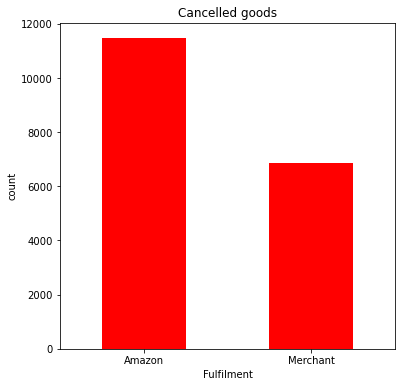

In [10]:
status1['Cancelled'].plot(kind= 'bar', color= 'red', figsize=(6, 6))  #figsize is the size of the box, we can reduce or increase
plt.title("Cancelled goods")
plt.ylabel("count")  
plt.xticks(rotation = 0) #so amazon and merchant appear in horizontal form
plt.show()

<h3>We also checked the percentage of cancellations between Amazon and Merchant, looking only at the cancelled items.</h3>

In [11]:
#Finding the percentage using the vertical column. 
#This is the formular to be used for each item in the vertical column (value of amazon/ sum of vertical) * 100
percentage = status1.div(status1.sum(axis = 0), axis = 1)*100
percentage

Status,Cancelled,Pending,Pending - Waiting for Pick Up,Shipped,Shipped - Damaged,Shipped - Delivered to Buyer,Shipped - Lost in Transit,Shipped - Out for Delivery,Shipped - Picked Up,Shipped - Rejected by Buyer,Shipped - Returned to Seller,Shipped - Returning to Seller,Shipping
Fulfilment,,,,,,,,,,,,,
Amazon,62.573642,63.069909,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0
Merchant,37.426358,36.930091,100.0,0.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,0.0


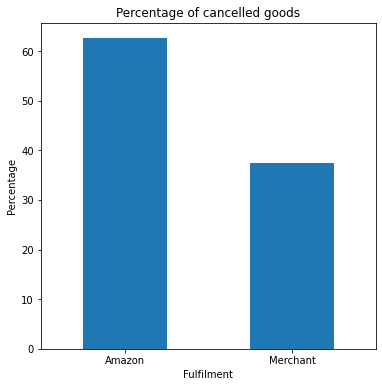

In [13]:
percentage['Cancelled'].plot(kind= 'bar', figsize=(6, 6))  
plt.title("Percentage of cancelled goods")
plt.ylabel("Percentage")  
plt.xticks(rotation = 0)
plt.show()

<h3>Next, we proceed to investigate why Amazon has a higher number of canceled items. To do this, we selected two additional columns Ship-State and Status and created a cross tab. This allows us to examine whether the shipping state may be a contributing factor to the increased cancellations.</h3>

In [14]:
#This helps us to see the full dataset for each column or generally
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None) 

#Ship-state and Status
status2 = pd.crosstab(combine['ship-state'], combine['Status'])
status2

Status,Cancelled,Pending,Pending - Waiting for Pick Up,Shipped,Shipped - Damaged,Shipped - Delivered to Buyer,Shipped - Lost in Transit,Shipped - Out for Delivery,Shipped - Picked Up,Shipped - Rejected by Buyer,Shipped - Returned to Seller,Shipped - Returning to Seller,Shipping
ship-state,,,,,,,,,,,,,
ANDAMAN & NICOBAR,45,2,3,138,0,44,0,0,14,0,7,4,0
ANDHRA PRADESH,892,25,16,3158,0,1196,0,2,43,2,88,8,0
APO,1,0,0,0,0,0,0,0,0,0,0,0,0
AR,0,0,0,1,0,0,0,0,0,0,0,0,0
ARUNACHAL PRADESH,19,1,1,72,0,36,0,0,8,0,4,0,0
ASSAM,248,9,12,936,0,363,0,0,27,0,60,8,0
Arunachal Pradesh,1,0,0,1,0,1,0,0,0,0,0,0,0
Arunachal pradesh,0,0,0,1,0,1,0,0,0,0,0,0,0
BIHAR,340,13,6,1181,0,454,0,1,30,0,53,8,0


<h3>Our analysis shows that Maharashtra has the highest number of cancellations. To understand this better, we filtered the dataset specifically for this state. 
The high cancellation rate in Maharashtra could be linked to factors such as a larger customer base or challenges in delivery.</h3>

In [15]:
#To filter for Maharashtra state
A = combine[combine['ship-state']== 'MAHARASHTRA']
A

,Status,Fulfilment,ship-service-level,Amount,promotion-ids,B2B,ship-state,ship-city
0,Cancelled,Merchant,Standard,647.62,NaN,False,MAHARASHTRA,MUMBAI
2,Shipped,Amazon,Expedited,329.00,IN Core Free Shipping 2015/04/08 23-48-5-108,True,MAHARASHTRA,NAVI MUMBAI
12,Shipped - Delivered to Buyer,Merchant,Standard,399.00,Amazon PLCC Free-Financing Universal Merchant ...,False,MAHARASHTRA,Amravati.
13,Shipped,Amazon,Expedited,657.00,NaN,False,MAHARASHTRA,MUMBAI
14,Shipped - Delivered to Buyer,Merchant,Standard,771.00,Amazon PLCC Free-Financing Universal Merchant ...,False,MAHARASHTRA,MUMBAI
23,Cancelled,Merchant,Standard,570.48,NaN,False,MAHARASHTRA,pune
27,Shipped,Amazon,Expedited,459.00,NaN,False,MAHARASHTRA,PUNE
42,Shipped - Delivered to Buyer,Merchant,Standard,424.00,Amazon PLCC Free-Financing Universal Merchant ...,False,MAHARASHTRA,MUMBAI
44,Shipped,Amazon,Expedited,788.00,NaN,False,MAHARASHTRA,MUMBAI
51,Shipped,Amazon,Expedited,654.00,IN Core Free Shipping 2015/04/08 23-48-5-108,False,MAHARASHTRA,BADLAPUR


<h3>Next, I conducted a crosstab analysis between Status and Fulfilment for Maharashtra. The results reveal that cancellations are more frequent in orders fulfilled directly by Amazon compared to those handled by merchants</h3>

In [16]:
status3 = pd.crosstab(A["Status"], A["Fulfilment"])
status3


Fulfilment,Amazon,Merchant
Status,,
Cancelled,1928,1038
Pending,89,44
Pending - Waiting for Pick Up,0,36
Shipped,13775,0
Shipped - Delivered to Buyer,0,4967
Shipped - Out for Delivery,0,5
Shipped - Picked Up,0,108
Shipped - Rejected by Buyer,0,4
Shipped - Returned to Seller,0,248


<h3>We selected two additional columns and conducted a deeper analysis to investigate why Amazon records a higher number of cancelled orders in Maharashtra.</h3>

In [17]:
status3 = pd.crosstab(A["Status"], A["ship-service-level"])
status3

ship-service-level,Expedited,Standard
Status,,
Cancelled,1922,1044
Pending,89,44
Pending - Waiting for Pick Up,0,36
Shipped,13686,89
Shipped - Delivered to Buyer,0,4967
Shipped - Out for Delivery,0,5
Shipped - Picked Up,0,108
Shipped - Rejected by Buyer,0,4
Shipped - Returned to Seller,0,248


<h3>We can see that expedited orders have a higher cancellation rate compared to standard orders. <br>Expedited orders refer to faster-than-usual delivery requests, while standard orders follow the regular delivery timeline.</h3>

<h3>Next, we get the dataset to include only rows where the ‘Status’ column is marked as ‘Cancelled’ and the state is Maharashtra</h3>

In [18]:
B = A[A['Status']== 'Cancelled']
B

,Status,Fulfilment,ship-service-level,Amount,promotion-ids,B2B,ship-state,ship-city
0,Cancelled,Merchant,Standard,647.62,NaN,False,MAHARASHTRA,MUMBAI
23,Cancelled,Merchant,Standard,570.48,NaN,False,MAHARASHTRA,pune
95,Cancelled,Amazon,Expedited,NaN,NaN,False,MAHARASHTRA,PUNE
193,Cancelled,Amazon,Expedited,597.00,NaN,False,MAHARASHTRA,KALYAN
242,Cancelled,Amazon,Expedited,NaN,NaN,False,MAHARASHTRA,KARANJA
381,Cancelled,Amazon,Expedited,NaN,IN Core Free Shipping 2015/04/08 23-48-5-108,False,MAHARASHTRA,SOLAPUR
413,Cancelled,Amazon,Expedited,NaN,NaN,False,MAHARASHTRA,"Chinchwad ,Pune"
428,Cancelled,Amazon,Expedited,NaN,NaN,False,MAHARASHTRA,AKOLA
437,Cancelled,Merchant,Standard,570.48,NaN,False,MAHARASHTRA,MUMBAI
485,Cancelled,Amazon,Expedited,399.00,NaN,False,MAHARASHTRA,Mumbai


<h3>We performed a crosstab analysis on the columns Fulfilment and B2B. <br>The results show that most orders were fulfilled through the B2C channel rather than B2B.</h3>

In [19]:
status3 = pd.crosstab(B["Fulfilment"], B["B2B"])
status3

B2B,False,True
Fulfilment,,
Amazon,1913,15
Merchant,1037,1


In [20]:
percentage11 = status3.div(status3.sum(axis = 0), axis = 1)*100
percentage11

B2B,False,True
Fulfilment,,
Amazon,64.847458,93.75
Merchant,35.152542,6.25


<h3>We concluded the report with a bar chart visualization showing the percentage distribution of Not B2B orders between Amazon and Merchants. This provided a clearer comparison of how each channel contributes to B2B transactions</h3>

(array([0, 1]), [Text(0, 0, 'Amazon'), Text(1, 0, 'Merchant')])

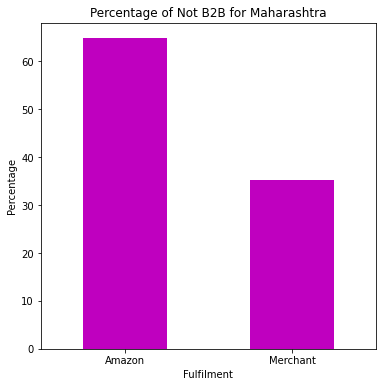

In [21]:
percentage11[False].plot(kind='bar', color= 'm', figsize=(6, 6))  
plt.title("Percentage of Not B2B for Maharashtra")   #Not B2B(means B2C)
plt.ylabel("Percentage")  
plt.xticks(rotation=0)

<h3>This conclusion is based solely on the analysis of orders from Maharashtra State. <br>Further investigation is required to determine if the same factors contribute to high cancellation rates in other states with significant cancellations.</h3>

<h3>
Findings and Recommendation: <br>
At the end of this project, the analysis revealed that most order cancellations occurred during B2C (Business-to-Consumer) transactions.
    
Recommendation:<br>
It is recommended that Amazon focus more on B2B (Business-to-Business) transactions, as they tend to have lower cancellation rates and more stable order fulfillment.
</h3>